# Disease Prediction

In [1]:
import warnings
warnings.filterwarnings("ignore")

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

## Read and View Dataset 

In [2]:
dataset = pd.read_csv('dataset.csv')

In [3]:
dataset.head()

,itching,skin_rash,nodal_skin_eruptions,continuous_sneezing,shivering,chills,joint_pain,stomach_pain,acidity,ulcers_on_tongue,...,blackheads,scurring,skin_peeling,silver_like_dusting,small_dents_in_nails,inflammatory_nails,blister,red_sore_around_nose,yellow_crust_ooze,prognosis
0,1,1,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,Fungal infection
1,0,1,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,Fungal infection
2,1,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,Fungal infection
3,1,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,Fungal infection
4,1,1,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,Fungal infection


In [4]:
dataset.shape

(4962, 133)

In [5]:
dataset.info(verbose = True, show_counts = True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4962 entries, 0 to 4961
Data columns (total 133 columns):
 #    Column                          Non-Null Count  Dtype 
---   ------                          --------------  ----- 
 0    itching                         4962 non-null   int64 
 1    skin_rash                       4962 non-null   int64 
 2    nodal_skin_eruptions            4962 non-null   int64 
 3    continuous_sneezing             4962 non-null   int64 
 4    shivering                       4962 non-null   int64 
 5    chills                          4962 non-null   int64 
 6    joint_pain                      4962 non-null   int64 
 7    stomach_pain                    4962 non-null   int64 
 8    acidity                         4962 non-null   int64 
 9    ulcers_on_tongue                4962 non-null   int64 
 10   muscle_wasting                  4962 non-null   int64 
 11   vomiting                        4962 non-null   int64 
 12   burning_micturition             

In [6]:
dataset.describe()

,itching,skin_rash,nodal_skin_eruptions,continuous_sneezing,shivering,chills,joint_pain,stomach_pain,acidity,ulcers_on_tongue,...,pus_filled_pimples,blackheads,scurring,skin_peeling,silver_like_dusting,small_dents_in_nails,inflammatory_nails,blister,red_sore_around_nose,yellow_crust_ooze
count,4962.000000,4962.000000,4962.000000,4962.000000,4962.000000,4962.000000,4962.000000,4962.000000,4962.000000,4962.000000,...,4962.000000,4962.000000,4962.000000,4962.000000,4962.000000,4962.000000,4962.000000,4962.000000,4962.000000,4962.000000
mean,0.138049,0.160016,0.021967,0.045143,0.021967,0.162233,0.139057,0.045143,0.045143,0.021967,...,0.021967,0.021967,0.021967,0.023378,0.023176,0.023176,0.023176,0.023176,0.023378,0.023176
std,0.344986,0.366658,0.146590,0.207639,0.146590,0.368702,0.346041,0.207639,0.207639,0.146590,...,0.146590,0.146590,0.146590,0.151115,0.150478,0.150478,0.150478,0.150478,0.151115,0.150478
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [7]:
dataset.nunique()

itching                  2
skin_rash                2
nodal_skin_eruptions     2
continuous_sneezing      2
shivering                2
                        ..
inflammatory_nails       2
blister                  2
red_sore_around_nose     2
yellow_crust_ooze        2
prognosis               41
Length: 133, dtype: int64

In [8]:
# Identify null values
null_columns = dataset.columns[dataset.isnull().any()]
dataset[null_columns].isnull().sum()

Series([], dtype: float64)

In [9]:
dataset['prognosis'].describe()

count                 4962
unique                  41
top       Fungal infection
freq                   122
Name: prognosis, dtype: object

In [10]:
dataset['prognosis'].value_counts()

Fungal infection                           122
Hepatitis C                                121
Hepatitis E                                121
Alcoholic hepatitis                        121
Tuberculosis                               121
Common Cold                                121
Pneumonia                                  121
Dimorphic hemmorhoids(piles)               121
Heart attack                               121
Varicose veins                             121
Hypothyroidism                             121
Hyperthyroidism                            121
Hypoglycemia                               121
Osteoarthristis                            121
Arthritis                                  121
(vertigo) Paroymsal  Positional Vertigo    121
Acne                                       121
Urinary tract infection                    121
Psoriasis                                  121
Hepatitis D                                121
Hepatitis B                                121
Allergy      

In [11]:
sorted(dataset['prognosis'].unique())

['(vertigo) Paroymsal  Positional Vertigo',
 'AIDS',
 'Acne',
 'Alcoholic hepatitis',
 'Allergy',
 'Arthritis',
 'Bronchial Asthma',
 'Cervical spondylosis',
 'Chicken pox',
 'Chronic cholestasis',
 'Common Cold',
 'Dengue',
 'Diabetes ',
 'Dimorphic hemmorhoids(piles)',
 'Drug Reaction',
 'Fungal infection',
 'GERD',
 'Gastroenteritis',
 'Heart attack',
 'Hepatitis B',
 'Hepatitis C',
 'Hepatitis D',
 'Hepatitis E',
 'Hypertension ',
 'Hyperthyroidism',
 'Hypoglycemia',
 'Hypothyroidism',
 'Impetigo',
 'Jaundice',
 'Malaria',
 'Migraine',
 'Osteoarthristis',
 'Paralysis (brain hemorrhage)',
 'Peptic ulcer diseae',
 'Pneumonia',
 'Psoriasis',
 'Tuberculosis',
 'Typhoid',
 'Urinary tract infection',
 'Varicose veins',
 'hepatitis A']

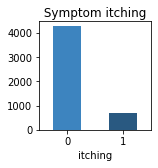

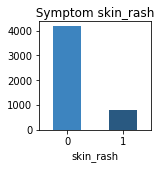

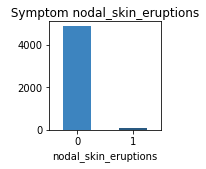

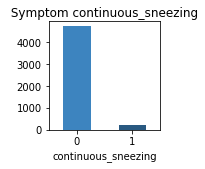

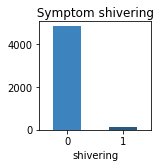

...

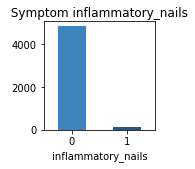

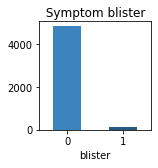

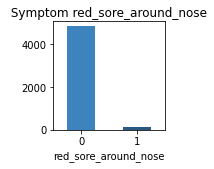

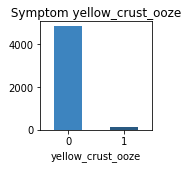

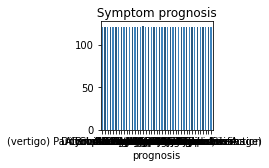

In [12]:
import matplotlib.pyplot as plt
import seaborn as sns

colors = ['#3d84bf', '#295981']
columns = list(dataset.columns)
for i in columns:
    figer, ax = plt.subplots(figsize=(2, 2))
    bar = dataset.groupby(i).size().plot(kind='bar', color=colors, ax=ax)
    plt.xticks(rotation=0)
    figer.suptitle(" Symptom " + i)

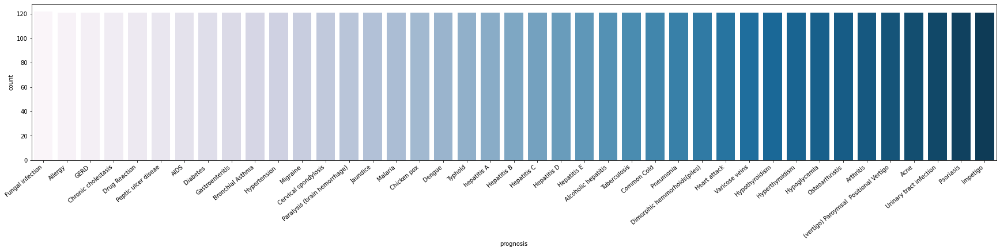

In [13]:
plt.figure(figsize=(30, 5))
ax = sns.countplot(dataset['prognosis'], palette='PuBu')
ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")
plt.show()

In [14]:
# Drop Column fluid_overload with NaN Values 
dataset = dataset.drop(['fluid_overload'], axis=1)

#Drop Rows with NaN Values 
dataset = dataset.dropna()
dataset

,itching,skin_rash,nodal_skin_eruptions,continuous_sneezing,shivering,chills,joint_pain,stomach_pain,acidity,ulcers_on_tongue,...,blackheads,scurring,skin_peeling,silver_like_dusting,small_dents_in_nails,inflammatory_nails,blister,red_sore_around_nose,yellow_crust_ooze,prognosis
0,1,1,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,Fungal infection
1,0,1,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,Fungal infection
2,1,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,Fungal infection
3,1,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,Fungal infection
4,1,1,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,Fungal infection
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4957,0,1,0,0,0,0,0,0,0,0,...,1,1,0,0,0,0,0,0,0,Acne
4958,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,Urinary tract infection
4959,0,1,0,0,0,0,1,0,0,0,...,0,0,1,1,1,1,0,0,0,Psoriasis
4960,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,1,1,Impetigo


In [15]:
corr = dataset.corr()
corr.style.background_gradient(cmap='coolwarm')

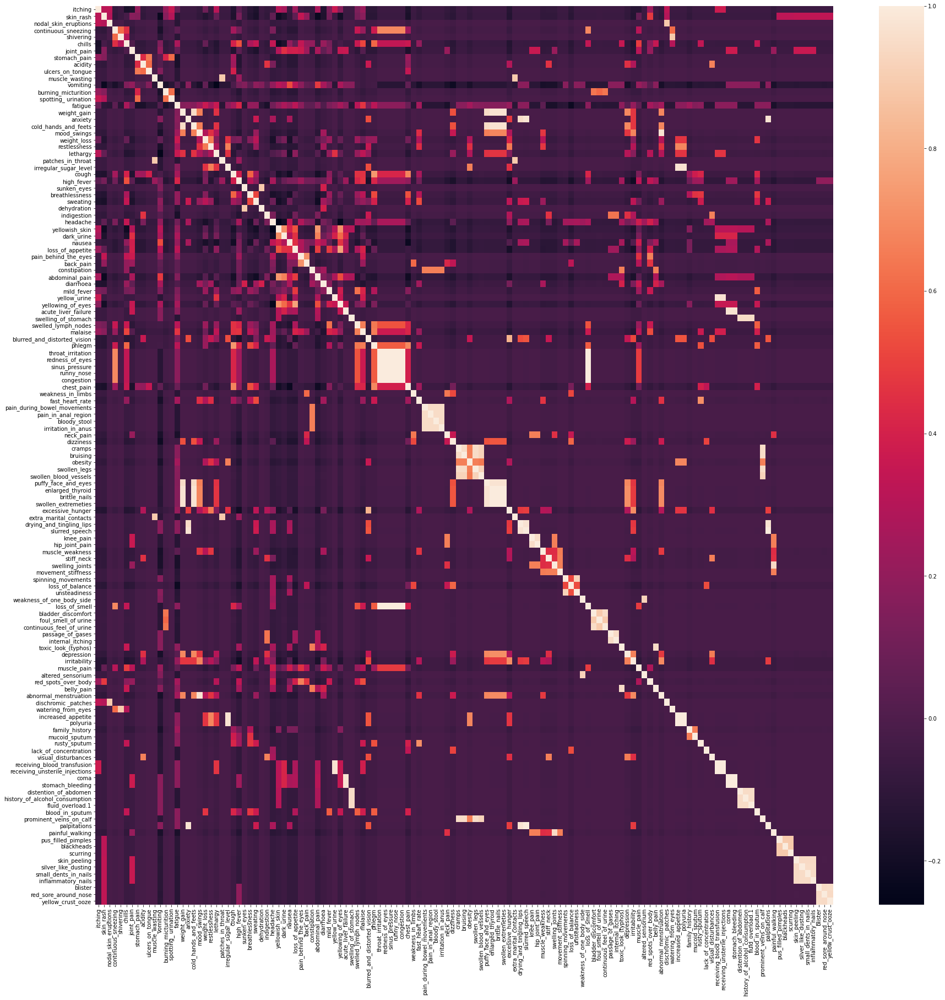

In [16]:
plt.figure(figsize=(30, 30))

correlation = dataset.corr()
sns.heatmap(correlation)

plt.show()

In [17]:
for i in range(correlation.shape[0]):
    for j in range(i + 1, correlation.shape[0]):
        if correlation.iloc[i, j] >= 0.8:
            print("\nCorrelation between {} and {} is {}".format(correlation.index[i], correlation.columns[j],
                                                               correlation.iloc[i, j]))


Correlation between nodal_skin_eruptions and dischromic _patches is 0.8874355595800957

Correlation between shivering and watering_from_eyes is 0.8874355595800958

Correlation between muscle_wasting and patches_in_throat is 0.8874355595800957

Correlation between muscle_wasting and extra_marital_contacts is 0.8874355595800953

Correlation between weight_gain and cold_hands_and_feets is 0.9465882078560471

Correlation between weight_gain and puffy_face_and_eyes is 0.9465882078560471

Correlation between weight_gain and enlarged_thyroid is 0.9742878047449606

Correlation between weight_gain and brittle_nails is 0.9742878047449606

Correlation between weight_gain and swollen_extremeties is 0.9742878047449606

Correlation between anxiety and drying_and_tingling_lips is 0.9465882078560471

Correlation between anxiety and slurred_speech is 0.9742878047449609

Correlation between anxiety and palpitations is 0.9742878047449609

Correlation between cold_hands_and_feets and puffy_face_and_eyes 

## Split The Dataset

In [18]:
from sklearn.model_selection import train_test_split


x = dataset.drop(['prognosis'], axis=1)
y = dataset['prognosis']

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=0)

print('\n', y_train.shape)
print('\n', y_test.shape)
print('\n', x_train.shape)
print('\n', x_test.shape)



 (3969,)

 (993,)

 (3969, 131)

 (993, 131)


# Logistic Regression

In [19]:
from sklearn.linear_model import LogisticRegression

lr = LogisticRegression()
lr.fit(x_train, y_train)
print("Accuracy: {:.2f}%".format(lr.score(x_test, y_test) * 100))

Accuracy: 100.00%


In [20]:
y_predict_lr = lr.predict(x_test)

In [21]:
from sklearn.metrics import classification_report
print(classification_report(y_test, y_predict_lr))

                                         precision    recall  f1-score   support

(vertigo) Paroymsal  Positional Vertigo       1.00      1.00      1.00        18
                                   AIDS       1.00      1.00      1.00        25
                                   Acne       1.00      1.00      1.00        26
                    Alcoholic hepatitis       1.00      1.00      1.00        25
                                Allergy       1.00      1.00      1.00        29
                              Arthritis       1.00      1.00      1.00        28
                       Bronchial Asthma       1.00      1.00      1.00        25
                   Cervical spondylosis       1.00      1.00      1.00        28
                            Chicken pox       1.00      1.00      1.00        22
                    Chronic cholestasis       1.00      1.00      1.00        27
                            Common Cold       1.00      1.00      1.00        22
                           

In [22]:
print('\n\n summarize predictions cases : \n\n')
for i in range(len(y_predict_lr)):
    print(
        '\n\n ------------------------------------------------------------------------------------------------------------------ \n\n')
    print(x_train.iloc[i],
          '\n\n( expected: ', y_predict_lr[i], ')')

print(
    '\n\n ------------------------------------------------------------------------------------------------------------------ \n\n')



 summarize predictions cases : 




 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 4434, Length: 131, dtype: int64 

( expected:  Impetigo )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 2863, Length: 131, dtype: int64 

( expected:  Malaria )


 --------------------

( expected:  Malaria )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 4455, Length: 131, dtype: int64 

( expected:  Arthritis )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 1
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 2843, Length: 131, dtype: int64 

( expected:  Acne )


 -----------------------------------

( expected:  Diabetes  )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               1
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 3235, Length: 131, dtype: int64 

( expected:  Migraine )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 3416, Length: 131, dtype: int64 

( expected:  Psoriasis )


 -----------------------------

Name: 2805, Length: 131, dtype: int64 

( expected:  Dimorphic hemmorhoids(piles) )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 1470, Length: 131, dtype: int64 

( expected:  GERD )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 1450, Length: 131, dtype: int64 

( 

Name: 4494, Length: 131, dtype: int64 

( expected:  Psoriasis )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 4599, Length: 131, dtype: int64 

( expected:  Heart attack )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 485, Length: 131, dtype: int64 

( expected:  C

itching                 1
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 553, Length: 131, dtype: int64 

( expected:  GERD )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 3787, Length: 131, dtype: int64 

( expected:  Hyperthyroidism )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 1
skin_rash               0
noda


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 4084, Length: 131, dtype: int64 

( expected:  Hepatitis C )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 3987, Length: 131, dtype: int64 

( expected:  hepatitis A )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0

( expected:  Diabetes  )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 685, Length: 131, dtype: int64 

( expected:  Bronchial Asthma )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 4910, Length: 131, dtype: int64 

( expected:  Chicken pox )


 --------------------

( expected:  Urinary tract infection )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 1
skin_rash               1
nodal_skin_eruptions    1
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 2058, Length: 131, dtype: int64 

( expected:  Dimorphic hemmorhoids(piles) )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 2696, Length: 131, dtype: int64 

( expected:  Gastroente

( expected:  Chronic cholestasis )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 3206, Length: 131, dtype: int64 

( expected:  Osteoarthristis )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 3711, Length: 131, dtype: int64 

( expected:  Hypoglycemia )


 ---------

( expected:  Hyperthyroidism )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 1881, Length: 131, dtype: int64 

( expected:  Chicken pox )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 3209, Length: 131, dtype: int64 

( expected:  Urinary tract infection )


 ------

Name: 4570, Length: 131, dtype: int64 

( expected:  Chronic cholestasis )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 3405, Length: 131, dtype: int64 

( expected:  Cervical spondylosis )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 527, Length: 131, dtype: int6

( expected:  Chronic cholestasis )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 1357, Length: 131, dtype: int64 

( expected:  Cervical spondylosis )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 3655, Length: 131, dtype: int64 

( expected:  hepatitis A )


 -----

( expected:  Hyperthyroidism )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 4751, Length: 131, dtype: int64 

( expected:  Varicose veins )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 1
skin_rash               1
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 985, Length: 131, dtype: int64 

( expected:  Hepatitis E )


 ----------------



 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 3638, Length: 131, dtype: int64 

( expected:  Dengue )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 4053, Length: 131, dtype: int64 

( expected:  Drug Reaction )


 ----------------------------------------------------

Name: 321, Length: 131, dtype: int64 

( expected:  Hypertension  )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 118, Length: 131, dtype: int64 

( expected:  Hypothyroidism )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     1
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 261, Length: 131, dtype: int64 

( expected

( expected:  Psoriasis )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 1
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 1266, Length: 131, dtype: int64 

( expected:  Peptic ulcer diseae )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 2247, Length: 131, dtype: int64 

( expected:  Allergy )


 --------------------

Name: 3214, Length: 131, dtype: int64 

( expected:  Gastroenteritis )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 3618, Length: 131, dtype: int64 

( expected:  Alcoholic hepatitis )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 4110, Length: 131, dtype: int64 



Name: 2575, Length: 131, dtype: int64 

( expected:  Hepatitis D )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 1292, Length: 131, dtype: int64 

( expected:  Bronchial Asthma )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 880, Length: 131, dtype: int64 

( expect


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 4072, Length: 131, dtype: int64 

( expected:  Dengue )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 2466, Length: 131, dtype: int64 

( expected:  Common Cold )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
noda

Name: 3238, Length: 131, dtype: int64 

( expected:  Dengue )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 4031, Length: 131, dtype: int64 

( expected:  Hepatitis C )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 1
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 1269, Length: 131, dtype: int64 

( expected:  AIDS



 ------------------------------------------------------------------------------------------------------------------ 


itching                 1
skin_rash               1
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 3530, Length: 131, dtype: int64 

( expected:  Hepatitis B )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 3225, Length: 131, dtype: int64 

( expected:  AIDS )


 --------------------------------------------------------

Name: 2311, Length: 131, dtype: int64 

( expected:  Peptic ulcer diseae )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 1
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 443, Length: 131, dtype: int64 

( expected:  Acne )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 1
skin_rash               1
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 4157, Length: 131, dtype: int64 

( expected: 

( expected:  Impetigo )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               1
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 3461, Length: 131, dtype: int64 

( expected:  Diabetes  )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 332, Length: 131, dtype: int64 

( expected:  Impetigo )


 -------------------------------

Name: 66, Length: 131, dtype: int64 

( expected:  Jaundice )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 188, Length: 131, dtype: int64 

( expected:  Arthritis )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 1794, Length: 131, dtype: int64 

( expected:  Drug Re

Name: 1573, Length: 131, dtype: int64 

( expected:  Peptic ulcer diseae )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               1
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 1191, Length: 131, dtype: int64 

( expected:  Alcoholic hepatitis )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 4266, Length: 131, dtype: int6

( expected:  Fungal infection )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 1451, Length: 131, dtype: int64 

( expected:  Migraine )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 3077, Length: 131, dtype: int64 

( expected:  Acne )


 ---------------------------

Name: 3500, Length: 131, dtype: int64 

( expected:  Dengue )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 3888, Length: 131, dtype: int64 

( expected:  Osteoarthristis )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 1334, Length: 131, dtype: int64 

( expected:  

## Dummy Encoding

In [23]:
y_train_enc = pd.get_dummies(y_train)
y_test_enc = pd.get_dummies(y_test)

# Neural Network

In [24]:
import keras
from keras.layers import Dense
from keras.models import Sequential
from keras.callbacks import EarlyStopping

# Define the keras model
nn = Sequential()
nn.add(Dense(64, activation='relu', input_shape=(x_train.shape[1],)))
nn.add(Dense(32, activation='relu'))
nn.add(Dense(16, activation='relu'))
nn.add(Dense(y_train_enc.shape[1], activation='softmax'))

In [25]:
nn.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 64)                8448      
_________________________________________________________________
dense_1 (Dense)              (None, 32)                2080      
_________________________________________________________________
dense_2 (Dense)              (None, 16)                528       
_________________________________________________________________
dense_3 (Dense)              (None, 41)                697       
Total params: 11,753
Trainable params: 11,753
Non-trainable params: 0
_________________________________________________________________


In [26]:
# Compile the keras model
from tensorflow.keras.optimizers import Adam  # - Works

nn.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

# Fit the keras model on the dataset
early_stopping_monitor= EarlyStopping(patience=2, monitor='val_accuracy')
history = nn.fit(x_train, y_train_enc, epochs=150, batch_size=10, validation_split=0.3, callbacks=[early_stopping_monitor])#,validation_data=(x_test, y_test)

Epoch 1/150
278/278 [==============================] - 2s 4ms/step - loss: 2.0967 - accuracy: 0.5410 - val_loss: 0.3047 - val_accuracy: 0.9731
Epoch 2/150
278/278 [==============================] - 1s 2ms/step - loss: 0.0823 - accuracy: 0.9975 - val_loss: 0.0183 - val_accuracy: 1.0000
Epoch 3/150
278/278 [==============================] - 1s 2ms/step - loss: 0.0114 - accuracy: 0.9996 - val_loss: 0.0064 - val_accuracy: 1.0000
Epoch 4/150
278/278 [==============================] - 1s 2ms/step - loss: 0.0047 - accuracy: 1.0000 - val_loss: 0.0034 - val_accuracy: 1.0000


In [27]:
 _, accuracy = nn.evaluate(x_test, y_test_enc)  # ,verbose=0 #batch_size=1, steps=5
print('Accuracy: %.2f' % (accuracy * 100))

32/32 [==============================] - 0s 1ms/step - loss: 0.0039 - accuracy: 1.0000
Accuracy: 100.00


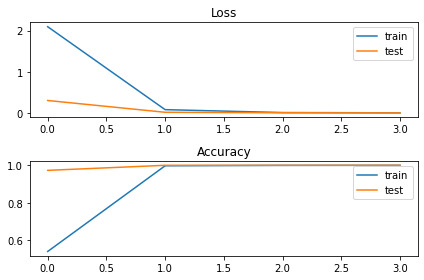

In [28]:
# plot loss during training
plt.subplot(211)
plt.title('Loss')
plt.plot(history.history['loss'], label='train')
plt.plot(history.history['val_loss'], label='test')
plt.legend()
# plot accuracy during training
plt.subplot(212)
plt.title('Accuracy')
plt.plot(history.history['accuracy'], label='train')
plt.plot(history.history['val_accuracy'], label='test')
plt.legend()
plt.tight_layout()
plt.show()

In [29]:
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import average_precision_score

y_predict_nn = nn.predict(x_test)
y_predict_nn = np.argmax(y_predict_nn, axis=1)

test_labels = np.argmax(np.array(y_test_enc), axis=1)

In [30]:
# Print the precision and recall, among other metrics
from sklearn.metrics import classification_report

print('\n\n', classification_report(test_labels, y_predict_nn))

print(
    '\n\n ------------------------------------------------------------------------------------------------------------------ \n\n')



               precision    recall  f1-score   support

           0       1.00      1.00      1.00        18
           1       1.00      1.00      1.00        25
           2       1.00      1.00      1.00        26
           3       1.00      1.00      1.00        25
           4       1.00      1.00      1.00        29
           5       1.00      1.00      1.00        28
           6       1.00      1.00      1.00        25
           7       1.00      1.00      1.00        28
           8       1.00      1.00      1.00        22
           9       1.00      1.00      1.00        27
          10       1.00      1.00      1.00        22
          11       1.00      1.00      1.00        28
          12       1.00      1.00      1.00        28
          13       1.00      1.00      1.00        17
          14       1.00      1.00      1.00        29
          15       1.00      1.00      1.00        20
          16       1.00      1.00      1.00        24
          17       1.00 

In [31]:
print('\n\n summarize predictions cases : \n\n')
for i in range(len(y_predict_nn)):
    print(
        '\n\n ------------------------------------------------------------------------------------------------------------------ \n\n')
    
    print(x_train.iloc[i],' \n\n( expected ', y_train.iloc[y_predict_nn[i]],') ')




 summarize predictions cases : 




 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 4434, Length: 131, dtype: int64  

( expected  Gastroenteritis ) 


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 2863, Length: 131, dtype: int64  

( expected  Allergy ) 


 -----------

( expected  Impetigo ) 


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 283, Length: 131, dtype: int64  

( expected  Allergy ) 


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 2708, Length: 131, dtype: int64  

( expected  Hyperthyroidism ) 


 ------------------------

Name: 4178, Length: 131, dtype: int64  

( expected  Allergy ) 


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 2770, Length: 131, dtype: int64  

( expected  Gastroenteritis ) 


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 927, Length: 131, dtype: int64  

( expected

Name: 4716, Length: 131, dtype: int64  

( expected  Osteoarthristis ) 


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 3254, Length: 131, dtype: int64  

( expected  GERD ) 


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 1077, Length: 131, dtype: int64  

( expected  

( expected  Bronchial Asthma ) 


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 2102, Length: 131, dtype: int64  

( expected  Chicken pox ) 


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 2108, Length: 131, dtype: int64  

( expected  Acne ) 


 ----------------------

( expected  AIDS ) 


 ------------------------------------------------------------------------------------------------------------------ 


itching                 1
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 2966, Length: 131, dtype: int64  

( expected  Allergy ) 


 ------------------------------------------------------------------------------------------------------------------ 


itching                 1
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 853, Length: 131, dtype: int64  

( expected  Bronchial Asthma ) 


 ---------------------------


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 2134, Length: 131, dtype: int64  

( expected  Urinary tract infection ) 


 ------------------------------------------------------------------------------------------------------------------ 


itching                 1
skin_rash               1
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 1390, Length: 131, dtype: int64  

( expected  Hypothyroidism ) 


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_ras

( expected  Hypoglycemia ) 


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 2549, Length: 131, dtype: int64  

( expected  Hypertension  ) 


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 2357, Length: 131, dtype: int64  

( expected  Acne ) 


 ------------------------

Name: 2452, Length: 131, dtype: int64  

( expected  Arthritis ) 


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     1
shivering               1
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 2067, Length: 131, dtype: int64  

( expected  AIDS ) 


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 321, Length: 131, dtype: int64  

( expected  Hyperte

Name: 832, Length: 131, dtype: int64  

( expected  (vertigo) Paroymsal  Positional Vertigo ) 


 ------------------------------------------------------------------------------------------------------------------ 


itching                 1
skin_rash               1
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 3079, Length: 131, dtype: int64  

( expected  Malaria ) 


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 944, Length: 131, dty

( expected  Urinary tract infection ) 


 ------------------------------------------------------------------------------------------------------------------ 


itching                 1
skin_rash               1
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 3530, Length: 131, dtype: int64  

( expected  Dimorphic hemmorhoids(piles) ) 


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 3225, Length: 131, dtype: int64  

( expected  Osteoarth

Name: 4785, Length: 131, dtype: int64  

( expected  Arthritis ) 


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               1
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 2013, Length: 131, dtype: int64  

( expected  Fungal infection ) 


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               1
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    1
inflammatory_nails      1
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 2030, Length: 131, dtype: int64  

( expe

( expected  Impetigo ) 


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     1
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 1496, Length: 131, dtype: int64  

( expected  Cervical spondylosis ) 


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               1
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 15, Length: 131, dtype: int64  

( expected  Arthritis ) 


 ------------------

Name: 3417, Length: 131, dtype: int64  

( expected  Gastroenteritis ) 


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               1
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 1
red_sore_around_nose    1
yellow_crust_ooze       1
Name: 4673, Length: 131, dtype: int64  

( expected  Hypoglycemia ) 


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 929, Length: 131, dtype: int64  

( exp

In [32]:
def create_model(learning_rate, activation):
    nn = Sequential()
    my_opt = Adam(lr=learning_rate)
    nn.add(Dense(64, activation='relu', input_shape=(x_train.shape[1],)))
    nn.add(Dense(32, activation='relu'))
    nn.add(Dense(16, activation='relu'))
    nn.add(Dense(y_train_enc.shape[1], activation='softmax'))
    nn.compile(optimizer=my_opt, loss='categorical_crossentropy', metrics=['accuracy'])
    return nn

In [33]:
from keras.wrappers.scikit_learn import KerasClassifier
kerasclassifier = KerasClassifier(build_fn=create_model, epochs=30, batch_size=100, validation_split=0.3)#,validation_data=(x_test, y_test)
from sklearn.model_selection import RandomizedSearchCV

In [34]:
params = {'activation': ['relu', 'tanh'], 'batch_size': [32, 128, 256],
          'epochs': [10], 'learning_rate': [0.1, 0.01, 0.001]}

In [35]:
random_search = RandomizedSearchCV(kerasclassifier, param_distributions=params, cv=5)
random_search.fit(x_train, y_train)

Epoch 1/10
9/9 [==============================] - 1s 35ms/step - loss: 3.2793 - accuracy: 0.1809 - val_loss: 2.4725 - val_accuracy: 0.3526
Epoch 2/10
9/9 [==============================] - 0s 9ms/step - loss: 1.6676 - accuracy: 0.6022 - val_loss: 0.6407 - val_accuracy: 0.8888
Epoch 3/10
9/9 [==============================] - 0s 10ms/step - loss: 0.2706 - accuracy: 0.9658 - val_loss: 0.0375 - val_accuracy: 0.9979
Epoch 4/10
9/9 [==============================] - 0s 9ms/step - loss: 0.0158 - accuracy: 1.0000 - val_loss: 0.0033 - val_accuracy: 1.0000
Epoch 5/10
9/9 [==============================] - 0s 10ms/step - loss: 0.0020 - accuracy: 1.0000 - val_loss: 9.1326e-04 - val_accuracy: 1.0000
Epoch 6/10
9/9 [==============================] - 0s 8ms/step - loss: 4.8962e-04 - accuracy: 1.0000 - val_loss: 5.7325e-04 - val_accuracy: 1.0000
Epoch 7/10
9/9 [==============================] - 0s 9ms/step - loss: 2.6875e-04 - accuracy: 1.0000 - val_loss: 3.3357e-04 - val_accuracy: 1.0000
Epoch 8/10


9/9 [==============================] - 0s 8ms/step - loss: 3.2398 - accuracy: 0.2727 - val_loss: 3.1168 - val_accuracy: 0.3557
Epoch 6/10
9/9 [==============================] - 0s 7ms/step - loss: 3.0219 - accuracy: 0.3546 - val_loss: 2.8686 - val_accuracy: 0.4050
Epoch 7/10
9/9 [==============================] - 0s 7ms/step - loss: 2.7570 - accuracy: 0.4388 - val_loss: 2.5765 - val_accuracy: 0.5373
Epoch 8/10
9/9 [==============================] - 0s 8ms/step - loss: 2.4494 - accuracy: 0.5617 - val_loss: 2.2420 - val_accuracy: 0.6925
Epoch 9/10
9/9 [==============================] - 0s 7ms/step - loss: 2.1041 - accuracy: 0.7255 - val_loss: 1.8765 - val_accuracy: 0.7681
Epoch 10/10
4/4 [==============================] - 0s 3ms/step - loss: 1.5473 - accuracy: 0.7985
Epoch 1/10
9/9 [==============================] - 1s 29ms/step - loss: 3.6807 - accuracy: 0.0549 - val_loss: 3.6338 - val_accuracy: 0.0756
Epoch 2/10
9/9 [==============================] - 0s 8ms/step - loss: 3.5981 - accura

7/7 [==============================] - 0s 2ms/step - loss: 4.7407 - accuracy: 0.9018
Epoch 1/10
18/18 [==============================] - 1s 15ms/step - loss: 1.9089 - accuracy: 0.4644 - val_loss: 0.1678 - val_accuracy: 0.9496
Epoch 2/10
18/18 [==============================] - 0s 5ms/step - loss: 0.2454 - accuracy: 0.9374 - val_loss: 0.3877 - val_accuracy: 0.9486
Epoch 3/10
18/18 [==============================] - 0s 5ms/step - loss: 0.4490 - accuracy: 0.9235 - val_loss: 1.4463 - val_accuracy: 0.8048
Epoch 4/10
18/18 [==============================] - 0s 5ms/step - loss: 0.8354 - accuracy: 0.9239 - val_loss: 2.2385 - val_accuracy: 0.9098
Epoch 5/10
18/18 [==============================] - 0s 5ms/step - loss: 0.5955 - accuracy: 0.9451 - val_loss: 0.2294 - val_accuracy: 0.9402
Epoch 6/10
18/18 [==============================] - 0s 5ms/step - loss: 0.5825 - accuracy: 0.9392 - val_loss: 0.3870 - val_accuracy: 0.9696
Epoch 7/10
18/18 [==============================] - 0s 5ms/step - loss: 0.

70/70 [==============================] - 0s 3ms/step - loss: 1.4471e-04 - accuracy: 1.0000 - val_loss: 1.4473e-04 - val_accuracy: 1.0000
Epoch 6/10
70/70 [==============================] - 0s 3ms/step - loss: 1.0840e-04 - accuracy: 1.0000 - val_loss: 1.1398e-04 - val_accuracy: 1.0000
Epoch 7/10
70/70 [==============================] - 0s 3ms/step - loss: 8.6492e-05 - accuracy: 1.0000 - val_loss: 9.3104e-05 - val_accuracy: 1.0000
Epoch 8/10
70/70 [==============================] - 0s 3ms/step - loss: 7.0236e-05 - accuracy: 1.0000 - val_loss: 7.7291e-05 - val_accuracy: 1.0000
Epoch 9/10
70/70 [==============================] - 0s 3ms/step - loss: 5.8227e-05 - accuracy: 1.0000 - val_loss: 6.9244e-05 - val_accuracy: 1.0000
Epoch 10/10
25/25 [==============================] - 0s 2ms/step - loss: 6.3195e-05 - accuracy: 1.0000
Epoch 1/10
70/70 [==============================] - 1s 7ms/step - loss: 1.0574 - accuracy: 0.7421 - val_loss: 0.0090 - val_accuracy: 1.0000
Epoch 2/10
70/70 [==========

18/18 [==============================] - 0s 5ms/step - loss: 1.4897 - accuracy: 0.9541 - val_loss: 2.7921 - val_accuracy: 0.9454
Epoch 9/10
18/18 [==============================] - 0s 5ms/step - loss: 1.9913 - accuracy: 0.9608 - val_loss: 0.7482 - val_accuracy: 0.9769
Epoch 10/10
7/7 [==============================] - 0s 2ms/step - loss: 0.0404 - accuracy: 0.9950
Epoch 1/10
18/18 [==============================] - 1s 14ms/step - loss: 1.7068 - accuracy: 0.5023 - val_loss: 0.2612 - val_accuracy: 0.9087
Epoch 2/10
18/18 [==============================] - 0s 5ms/step - loss: 0.1571 - accuracy: 0.9577 - val_loss: 0.1440 - val_accuracy: 0.9664
Epoch 3/10
18/18 [==============================] - 0s 5ms/step - loss: 0.4203 - accuracy: 0.9253 - val_loss: 0.9701 - val_accuracy: 0.9003
Epoch 4/10
18/18 [==============================] - 0s 5ms/step - loss: 1.1672 - accuracy: 0.8573 - val_loss: 3.3796 - val_accuracy: 0.6611
Epoch 5/10
18/18 [==============================] - 0s 5ms/step - loss: 1

9/9 [==============================] - 0s 9ms/step - loss: 0.1671 - accuracy: 0.9509 - val_loss: 0.8108 - val_accuracy: 0.9297
Epoch 4/10
9/9 [==============================] - 0s 8ms/step - loss: 0.4267 - accuracy: 0.9374 - val_loss: 0.6754 - val_accuracy: 0.9286
Epoch 5/10
9/9 [==============================] - 0s 8ms/step - loss: 0.3041 - accuracy: 0.9532 - val_loss: 0.5614 - val_accuracy: 0.9255
Epoch 6/10
9/9 [==============================] - 0s 7ms/step - loss: 0.3871 - accuracy: 0.9478 - val_loss: 2.8136 - val_accuracy: 0.8951
Epoch 7/10
9/9 [==============================] - 0s 8ms/step - loss: 0.5974 - accuracy: 0.9401 - val_loss: 0.8879 - val_accuracy: 0.8793
Epoch 8/10
9/9 [==============================] - 0s 8ms/step - loss: 1.3054 - accuracy: 0.9194 - val_loss: 0.1860 - val_accuracy: 0.9559
Epoch 9/10
9/9 [==============================] - 0s 7ms/step - loss: 0.5602 - accuracy: 0.9500 - val_loss: 0.0119 - val_accuracy: 0.9979
Epoch 10/10
4/4 [============================

18/18 [==============================] - 0s 4ms/step - loss: 0.3876 - accuracy: 0.9982 - val_loss: 0.2644 - val_accuracy: 1.0000
Epoch 9/10
18/18 [==============================] - 0s 5ms/step - loss: 0.1968 - accuracy: 1.0000 - val_loss: 0.1424 - val_accuracy: 1.0000
Epoch 10/10
7/7 [==============================] - 0s 2ms/step - loss: 0.0926 - accuracy: 0.9987
Epoch 1/10
18/18 [==============================] - 1s 14ms/step - loss: 3.6370 - accuracy: 0.0779 - val_loss: 3.5553 - val_accuracy: 0.1668
Epoch 2/10
18/18 [==============================] - 0s 5ms/step - loss: 3.4609 - accuracy: 0.2115 - val_loss: 3.3227 - val_accuracy: 0.2361
Epoch 3/10
18/18 [==============================] - 0s 5ms/step - loss: 3.1559 - accuracy: 0.2700 - val_loss: 2.9414 - val_accuracy: 0.3012
Epoch 4/10
18/18 [==============================] - 0s 5ms/step - loss: 2.6918 - accuracy: 0.3596 - val_loss: 2.4037 - val_accuracy: 0.4418
Epoch 5/10
18/18 [==============================] - 0s 5ms/step - loss: 2

Epoch 3/10
70/70 [==============================] - 0s 3ms/step - loss: 1.2639 - accuracy: 0.8348 - val_loss: 2.3582 - val_accuracy: 0.8227
Epoch 4/10
70/70 [==============================] - 0s 3ms/step - loss: 2.6396 - accuracy: 0.7907 - val_loss: 1.8088 - val_accuracy: 0.5582
Epoch 5/10
70/70 [==============================] - 0s 3ms/step - loss: 1.7056 - accuracy: 0.6341 - val_loss: 1.1499 - val_accuracy: 0.6558
Epoch 6/10
70/70 [==============================] - 0s 3ms/step - loss: 1.6794 - accuracy: 0.6530 - val_loss: 1.6741 - val_accuracy: 0.6034
Epoch 7/10
70/70 [==============================] - 0s 3ms/step - loss: 2.6401 - accuracy: 0.6017 - val_loss: 9.0261 - val_accuracy: 0.5404
Epoch 8/10
70/70 [==============================] - 0s 3ms/step - loss: 3.8017 - accuracy: 0.5473 - val_loss: 14.1998 - val_accuracy: 0.4921
Epoch 9/10
70/70 [==============================] - 0s 3ms/step - loss: 3.2377 - accuracy: 0.4824 - val_loss: 2.4194 - val_accuracy: 0.3757
Epoch 10/10
25/25 [

Epoch 7/10
18/18 [==============================] - 0s 5ms/step - loss: 5.9156e-04 - accuracy: 0.9995 - val_loss: 0.0031 - val_accuracy: 0.9979
Epoch 8/10
18/18 [==============================] - 0s 5ms/step - loss: 0.0043 - accuracy: 0.9986 - val_loss: 5.4449e-04 - val_accuracy: 1.0000
Epoch 9/10
18/18 [==============================] - 0s 5ms/step - loss: 0.0019 - accuracy: 0.9995 - val_loss: 2.1900e-04 - val_accuracy: 1.0000
Epoch 10/10
7/7 [==============================] - 0s 2ms/step - loss: 2.2285e-04 - accuracy: 1.0000
Epoch 1/10
18/18 [==============================] - 1s 17ms/step - loss: 2.6534 - accuracy: 0.3581 - val_loss: 0.8228 - val_accuracy: 0.8888
Epoch 2/10
18/18 [==============================] - 0s 5ms/step - loss: 0.1883 - accuracy: 0.9834 - val_loss: 0.0073 - val_accuracy: 0.9979
Epoch 3/10
18/18 [==============================] - 0s 5ms/step - loss: 0.0022 - accuracy: 1.0000 - val_loss: 4.6191e-04 - val_accuracy: 1.0000
Epoch 4/10
18/18 [========================

7/7 [==============================] - 0s 3ms/step - loss: 7.7454e-05 - accuracy: 1.0000
Epoch 1/10
18/18 [==============================] - 1s 14ms/step - loss: 2.6645 - accuracy: 0.3567 - val_loss: 0.8633 - val_accuracy: 0.8846
Epoch 2/10
18/18 [==============================] - 0s 5ms/step - loss: 0.2114 - accuracy: 0.9735 - val_loss: 0.0053 - val_accuracy: 1.0000
Epoch 3/10
18/18 [==============================] - 0s 6ms/step - loss: 0.0042 - accuracy: 0.9996 - val_loss: 6.9751e-04 - val_accuracy: 1.0000
Epoch 4/10
18/18 [==============================] - 0s 6ms/step - loss: 5.2849e-04 - accuracy: 1.0000 - val_loss: 2.9514e-04 - val_accuracy: 1.0000
Epoch 5/10
18/18 [==============================] - 0s 5ms/step - loss: 5.3775e-04 - accuracy: 0.9996 - val_loss: 1.9999e-04 - val_accuracy: 1.0000
Epoch 6/10
18/18 [==============================] - 0s 5ms/step - loss: 1.4301e-04 - accuracy: 1.0000 - val_loss: 1.0263e-04 - val_accuracy: 1.0000
Epoch 7/10
18/18 [========================

RandomizedSearchCV(cv=5,
                   estimator=<keras.wrappers.scikit_learn.KerasClassifier object at 0x0000016DE42856A0>,
                   param_distributions={'activation': ['relu', 'tanh'],
                                        'batch_size': [32, 128, 256],
                                        'epochs': [10],
                                        'learning_rate': [0.1, 0.01, 0.001]})

In [36]:
random_search.best_estimator_.fit(x_train, y_train)

Epoch 1/10
11/11 [==============================] - 1s 23ms/step - loss: 3.0903 - accuracy: 0.2664 - val_loss: 1.9548 - val_accuracy: 0.5592
Epoch 2/10
11/11 [==============================] - 0s 7ms/step - loss: 0.9743 - accuracy: 0.7937 - val_loss: 0.1791 - val_accuracy: 0.9807
Epoch 3/10
11/11 [==============================] - 0s 8ms/step - loss: 0.0595 - accuracy: 0.9971 - val_loss: 0.0055 - val_accuracy: 1.0000
Epoch 4/10
11/11 [==============================] - 0s 8ms/step - loss: 0.0027 - accuracy: 1.0000 - val_loss: 7.3950e-04 - val_accuracy: 1.0000
Epoch 5/10
11/11 [==============================] - 0s 8ms/step - loss: 3.8250e-04 - accuracy: 1.0000 - val_loss: 2.7058e-04 - val_accuracy: 1.0000
Epoch 6/10
11/11 [==============================] - 0s 7ms/step - loss: 1.7917e-04 - accuracy: 1.0000 - val_loss: 1.5311e-04 - val_accuracy: 1.0000
Epoch 7/10
11/11 [==============================] - 0s 7ms/step - loss: 1.2715e-04 - accuracy: 1.0000 - val_loss: 1.2402e-04 - val_accuracy

In [37]:
accuracy = random_search.best_estimator_.score(x_test, y_test)
print('\nAccuracy: %.2f' % (accuracy * 100))

4/4 [==============================] - 0s 3ms/step - loss: 9.0076e-05 - accuracy: 1.0000

Accuracy: 100.00


In [38]:
y_predict_estimator = random_search.best_estimator_.predict(x_test)

In [39]:
# Print the precision and recall, among other metrics
from sklearn.metrics import classification_report

print('\n\n', classification_report(y_test, y_predict_estimator))




                                          precision    recall  f1-score   support

(vertigo) Paroymsal  Positional Vertigo       1.00      1.00      1.00        18
                                   AIDS       1.00      1.00      1.00        25
                                   Acne       1.00      1.00      1.00        26
                    Alcoholic hepatitis       1.00      1.00      1.00        25
                                Allergy       1.00      1.00      1.00        29
                              Arthritis       1.00      1.00      1.00        28
                       Bronchial Asthma       1.00      1.00      1.00        25
                   Cervical spondylosis       1.00      1.00      1.00        28
                            Chicken pox       1.00      1.00      1.00        22
                    Chronic cholestasis       1.00      1.00      1.00        27
                            Common Cold       1.00      1.00      1.00        22
                        

In [40]:
print(
    '\n\n ------------------------------------------------------------------------------------------------------------------ \n\n')
print('\n\n summarize predictions cases : \n\n')
for i in range(len(y_predict_estimator)):
    print(
        '\n\n ------------------------------------------------------------------------------------------------------------------ \n\n')

    print(x_train.iloc[i], '\n\n( expected ', y_predict_estimator[i], ')')

print(
    '\n\n ------------------------------------------------------------------------------------------------------------------ \n\n')



 ------------------------------------------------------------------------------------------------------------------ 




 summarize predictions cases : 




 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 4434, Length: 131, dtype: int64 

( expected  Impetigo )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_no

Name: 3933, Length: 131, dtype: int64 

( expected  Chronic cholestasis )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 1326, Length: 131, dtype: int64 

( expected  Impetigo )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     1
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 2315, Length: 131, dtype: int64 

( expecte

( expected  Drug Reaction )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 900, Length: 131, dtype: int64 

( expected  AIDS )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               1
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    1
inflammatory_nails      1
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 2033, Length: 131, dtype: int64 

( expected  Arthritis )


 ---------------------------------



 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 485, Length: 131, dtype: int64 

( expected  Cervical spondylosis )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 3553, Length: 131, dtype: int64 

( expected  Hypoglycemia )


 ------------------------------------------



 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 1691, Length: 131, dtype: int64 

( expected  Osteoarthristis )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 1
skin_rash               1
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 4485, Length: 131, dtype: int64 

( expected  Impetigo )


 --------------------------------------------------

( expected  Hepatitis E )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 1
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 1021, Length: 131, dtype: int64 

( expected  Hepatitis B )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 2122, Length: 131, dtype: int64 

( expected  Typhoid )


 -----------------------------


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 1706, Length: 131, dtype: int64 

( expected  Hyperthyroidism )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 1881, Length: 131, dtype: int64 

( expected  Chicken pox )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash              

Name: 4570, Length: 131, dtype: int64 

( expected  Chronic cholestasis )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 3405, Length: 131, dtype: int64 

( expected  Cervical spondylosis )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 527, Length: 131, dtype: int64 

( expected  Hepatitis E )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 1754, Length: 131, dtype: int64 

( expected  Psoriasis )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 2337, Length: 131, dtype: int64 

( expected  Fungal infection )


 ----------------------

( expected  AIDS )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               1
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    1
inflammatory_nails      1
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 4221, Length: 131, dtype: int64 

( expected  Hepatitis D )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 4029, Length: 131, dtype: int64 

( expected  Tuberculosis )


 -------------------------------

Name: 421, Length: 131, dtype: int64 

( expected  AIDS )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 3029, Length: 131, dtype: int64 

( expected  Tuberculosis )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 3925, Length: 131, dtype: int64 

( expected  Acne )





itching                 1
skin_rash               1
nodal_skin_eruptions    1
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 418, Length: 131, dtype: int64 

( expected  (vertigo) Paroymsal  Positional Vertigo )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 4917, Length: 131, dtype: int64 

( expected  Hepatitis E )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 1


( expected  (vertigo) Paroymsal  Positional Vertigo )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 2166, Length: 131, dtype: int64 

( expected  Drug Reaction )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 1
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 3464, Length: 131, dtype: int64 

( expected  Diabetes  )


Name: 1283, Length: 131, dtype: int64 

( expected  Tuberculosis )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     1
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 2311, Length: 131, dtype: int64 

( expected  Peptic ulcer diseae )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 1
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 443, Length: 131, dtype: int64 

( expe

itching                 1
skin_rash               1
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 989, Length: 131, dtype: int64 

( expected  Hypothyroidism )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 306, Length: 131, dtype: int64 

( expected  Malaria )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal

itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 654, Length: 131, dtype: int64 

( expected  Acne )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     1
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 1496, Length: 131, dtype: int64 

( expected  Jaundice )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_skin_er



 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 361, Length: 131, dtype: int64 

( expected  (vertigo) Paroymsal  Positional Vertigo )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 1
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 200, Length: 131, dtype: int64 

( expected  Hepatitis C )


 -------------------------

# Support Vector Machine(SVM)

In [41]:
from sklearn import svm, datasets
from sklearn.metrics import average_precision_score
from sklearn.multiclass import OneVsRestClassifier
from sklearn.metrics import accuracy_score, f1_score

# Create a simple classifier
random_state = np.random.RandomState(0)
classifier = OneVsRestClassifier(svm.LinearSVC(random_state=random_state))
classifier.fit(x_train, y_train)
y_score = classifier.decision_function(x_test)
y_score = classifier.decision_function(x_test)
#yhat = classifier.predict(x_train)
yhat1 = classifier.predict(x_test)
print('Accuracy: %.2f' % (accuracy_score(y_test, yhat1) * 100))
print('F1: %.2f' % (f1_score(y_test, yhat1, average='micro') * 100))

Accuracy: 100.00
F1: 100.00


In [42]:
#Print the precision and recall, among other metrics
from sklearn.metrics import classification_report

print('\n\n', classification_report(y_test, yhat1))

print(
    '\n\n ------------------------------------------------------------------------------------------------------------------ \n\n')



                                          precision    recall  f1-score   support

(vertigo) Paroymsal  Positional Vertigo       1.00      1.00      1.00        18
                                   AIDS       1.00      1.00      1.00        25
                                   Acne       1.00      1.00      1.00        26
                    Alcoholic hepatitis       1.00      1.00      1.00        25
                                Allergy       1.00      1.00      1.00        29
                              Arthritis       1.00      1.00      1.00        28
                       Bronchial Asthma       1.00      1.00      1.00        25
                   Cervical spondylosis       1.00      1.00      1.00        28
                            Chicken pox       1.00      1.00      1.00        22
                    Chronic cholestasis       1.00      1.00      1.00        27
                            Common Cold       1.00      1.00      1.00        22
                        

In [43]:
print('\n\n summarize predictions cases : \n\n')
for i in range(len(yhat1)):
    print(
        '\n\n ------------------------------------------------------------------------------------------------------------------ \n\n')
    print(x_train.iloc[i], '\n\n( expected ', yhat1[i], ')')

print(
    '\n\n ------------------------------------------------------------------------------------------------------------------ \n\n')



 summarize predictions cases : 




 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 4434, Length: 131, dtype: int64 

( expected  Impetigo )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 2863, Length: 131, dtype: int64 

( expected  Malaria )


 ----------------------

( expected  Fungal infection )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 2374, Length: 131, dtype: int64 

( expected  Chronic cholestasis )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               1
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 1
red_sore_around_nose    1
yellow_crust_ooze       1
Name: 2459, Length: 131, dtype: int64 

( expected  Chicken pox )


 ------------

Name: 4874, Length: 131, dtype: int64 

( expected  Migraine )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 230, Length: 131, dtype: int64 

( expected  GERD )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 2378, Length: 131, dtype: int64 

( expected  Acne )


 ---



 ------------------------------------------------------------------------------------------------------------------ 


itching                 1
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 4653, Length: 131, dtype: int64 

( expected  AIDS )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 1922, Length: 131, dtype: int64 

( expected  AIDS )


 -----------------------------------------------------------------

( expected  Urinary tract infection )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               1
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 4178, Length: 131, dtype: int64 

( expected  Hypothyroidism )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 2770, Length: 131, dtype: int64 

( expected  Tuberculosis )


 ---------

( expected  Diabetes  )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 465, Length: 131, dtype: int64 

( expected  Osteoarthristis )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 2616, Length: 131, dtype: int64 

( expected  Jaundice )


 ---------------------------

Name: 429, Length: 131, dtype: int64 

( expected  Alcoholic hepatitis )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 4856, Length: 131, dtype: int64 

( expected  Gastroenteritis )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 1691, Length: 131, dtype: int64 

( e

( expected  Heart attack )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 221, Length: 131, dtype: int64 

( expected  Arthritis )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 4663, Length: 131, dtype: int64 

( expected  Typhoid )


 -------------------------------

( expected  Jaundice )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 4584, Length: 131, dtype: int64 

( expected  Tuberculosis )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     1
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 3839, Length: 131, dtype: int64 

( expected  Impetigo )


 ------------------------------

( expected  Peptic ulcer diseae )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 841, Length: 131, dtype: int64 

( expected  Hypoglycemia )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 1
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 4770, Length: 131, dtype: int64 

( expected  Drug Reaction )


 ---------------



 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 2272, Length: 131, dtype: int64 

( expected  Hypoglycemia )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 4570, Length: 131, dtype: int64 

( expected  Chronic cholestasis )


 ------------------------------------------

( expected  Heart attack )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 2433, Length: 131, dtype: int64 

( expected  Drug Reaction )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 467, Length: 131, dtype: int64 

( expected  Hepatitis B )


 -----------------------

Name: 4671, Length: 131, dtype: int64 

( expected  Hyperthyroidism )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 4751, Length: 131, dtype: int64 

( expected  Varicose veins )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 1
skin_rash               1
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 985, Length: 131, dtype: int64 

( expect

Name: 590, Length: 131, dtype: int64 

( expected  Migraine )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 1
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 3652, Length: 131, dtype: int64 

( expected  Hepatitis D )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 1144, Length: 131, dtype: int64 

( expected  hepati

Name: 2038, Length: 131, dtype: int64 

( expected  Heart attack )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 1
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 3335, Length: 131, dtype: int64 

( expected  Hypertension  )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 1
skin_rash               1
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 4362, Length: 131, dtype: int64 

( expected 

( expected  Urinary tract infection )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               1
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 1190, Length: 131, dtype: int64 

( expected  Psoriasis )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 1
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 1266, Length: 131, dtype: int64 

( expected  Peptic ulcer diseae )


 -------


itching                 0
skin_rash               1
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 998, Length: 131, dtype: int64 

( expected  Allergy )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 3767, Length: 131, dtype: int64 

( expected  hepatitis A )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_

Name: 1761, Length: 131, dtype: int64 

( expected  Bronchial Asthma )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 3459, Length: 131, dtype: int64 

( expected  Alcoholic hepatitis )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 3479, Length: 131, dtype: int64 

(


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 1473, Length: 131, dtype: int64 

( expected  Hepatitis D )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 436, Length: 131, dtype: int64 

( expected  Paralysis (brain hemorrhage) )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash  

( expected  Psoriasis )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 2645, Length: 131, dtype: int64 

( expected  Allergy )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 1995, Length: 131, dtype: int64 

( expected  Chicken pox )


 -------------------------------

( expected  Paralysis (brain hemorrhage) )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 66, Length: 131, dtype: int64 

( expected  Jaundice )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 188, Length: 131, dtype: int64 

( expected  Arthritis )


 ----------------

( expected  Chicken pox )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 4734, Length: 131, dtype: int64 

( expected  Acne )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 1018, Length: 131, dtype: int64 

( expected  Hypothyroidism )


 -----------------------------



 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 3077, Length: 131, dtype: int64 

( expected  Acne )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 191, Length: 131, dtype: int64 

( expected  Chicken pox )


 -----------------------------------------------------------

Name: 97, Length: 131, dtype: int64 

( expected  Drug Reaction )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 3705, Length: 131, dtype: int64 

( expected  Typhoid )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
small_dents_in_nails    0
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
Name: 2373, Length: 131, dtype: int64 

( expected  Malari

# Reduced data

## feature selection

In [44]:
from sklearn import metrics
# Print the confusion matrix
# print('\n\n',metrics.confusion_matrix(y_test_enc.ditinct(), predictions))
from sklearn.metrics import confusion_matrix

coefficients = np.mean(lr.coef_, axis=0)
print('\n\n', coefficients)



 [ 8.54330157e-16  1.26626352e-15  2.02370302e-16  1.04041098e-16
  6.97697320e-17  1.02221754e-15  9.72122112e-16 -3.77154270e-16
  4.93126881e-16 -6.09691836e-17 -4.35415592e-16  2.68619815e-15
  6.06730113e-17 -2.71399603e-16  3.92910636e-15 -6.30529673e-17
 -2.34589617e-16 -1.09805881e-16  6.77388362e-16  1.65788792e-15
  1.00965137e-15  6.68503193e-16 -3.18554465e-16  2.06865775e-16
  8.00342177e-16  1.91581168e-15  1.25103180e-15  5.33279383e-16
  4.30549905e-16  1.33125218e-15  4.50012656e-16  4.29195974e-16
  2.85408553e-15  1.77906470e-15  1.18468920e-15  1.67887384e-15
 -1.28284917e-16  5.11785736e-16 -4.66936787e-16  3.75038753e-15
  3.30900619e-15  1.20229030e-15  3.76985029e-16  1.80343545e-15
  5.81513157e-16  9.83461280e-16  5.31502349e-16  8.05588658e-16
  4.60378686e-16  5.81851640e-16  2.73536275e-17  2.73536275e-17
  2.84008081e-17  2.84008081e-17  2.84008081e-17  4.72521751e-16
  6.21157935e-16  1.03427598e-15 -1.20398271e-15 -1.19073958e-15
 -1.22281081e-15 -1.23

In [45]:
importance_threshold = np.quantile(np.abs(coefficients), q=0.25)
print('\n\n', importance_threshold)



 2.2148399306999002e-16


In [46]:
low_importance_features = x_train.columns[np.abs(coefficients) < importance_threshold]
print('\n\n', low_importance_features)



 Index(['nodal_skin_eruptions', 'continuous_sneezing', 'shivering',
       'ulcers_on_tongue', 'burning_micturition', 'weight_gain',
       'cold_hands_and_feets', 'irregular_sugar_level', 'pain_behind_the_eyes',
       'throat_irritation', 'redness_of_eyes', 'sinus_pressure', 'runny_nose',
       'congestion', 'swollen_blood_vessels', 'puffy_face_and_eyes',
       'enlarged_thyroid', 'brittle_nails', 'swollen_extremeties', 'knee_pain',
       'hip_joint_pain', 'loss_of_smell', 'passage_of_gases',
       'internal_itching', 'red_spots_over_body', 'dischromic _patches',
       'watering_from_eyes', 'increased_appetite', 'polyuria',
       'family_history', 'blister', 'red_sore_around_nose',
       'yellow_crust_ooze'],
      dtype='object')


In [47]:
import plotly.express as px

figer = px.bar(
    x=coefficients,
    y=x_train.columns,
    orientation='h',
    color=coefficients,
    color_continuous_scale=[(0, 'red'), (1, 'blue')],
    labels={'x': "Coefficient Value", 'y': "Feature"},
    title="Feature Importance From Model Weights"
)
figer.add_vline(x=importance_threshold, line_color='yellow')
figer.add_vline(x=-importance_threshold, line_color='yellow')
figer.add_vrect(x0=importance_threshold, x1=-importance_threshold, line_width=0, fillcolor='yellow', opacity=0.2)
figer.show()

## Reduced data for Logistic Regression

In [48]:
reduced_dataset = dataset.drop(low_importance_features, axis=1)

### Split Dataset

In [49]:
x1 = reduced_dataset.drop(['prognosis'], axis=1)
y1 = reduced_dataset['prognosis']

x_train_rd, x_test_rd, y_train_rd, y_test_rd = train_test_split(x1, y1, test_size=0.2, random_state=0)

In [50]:
lr = LogisticRegression()
lr.fit(x_train_rd, y_train_rd)

LogisticRegression()

In [51]:
print("Accuracy: {:.2f}%".format(lr.score(x_test_rd, y_test_rd) * 100))

Accuracy: 99.80%


In [52]:
y_predict_lr_rd = lr.predict(x_test_rd)

In [53]:
# Print the precision and recall, among other metrics
from sklearn.metrics import classification_report

print('\n\n',classification_report(y_test_rd, y_predict_lr_rd))

print(
    '\n\n ------------------------------------------------------------------------------------------------------------------ \n\n')



                                          precision    recall  f1-score   support

(vertigo) Paroymsal  Positional Vertigo       1.00      1.00      1.00        18
                                   AIDS       1.00      1.00      1.00        25
                                   Acne       1.00      1.00      1.00        26
                    Alcoholic hepatitis       1.00      1.00      1.00        25
                                Allergy       1.00      1.00      1.00        29
                              Arthritis       1.00      1.00      1.00        28
                       Bronchial Asthma       1.00      1.00      1.00        25
                   Cervical spondylosis       1.00      1.00      1.00        28
                            Chicken pox       1.00      1.00      1.00        22
                    Chronic cholestasis       1.00      1.00      1.00        27
                            Common Cold       1.00      1.00      1.00        22
                        

In [54]:
print('\n\n summarize predictions cases : \n\n')
for i in range(len(y_predict_lr)):
    print(
        '\n\n ------------------------------------------------------------------------------------------------------------------ \n\n')
    print(x_train_rd.iloc[i],
          '\n\n ( expected ', y_predict_lr_rd[i], ')')

print(
    '\n\n ------------------------------------------------------------------------------------------------------------------ \n\n')



 summarize predictions cases : 




 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
chills                  0
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 4434, Length: 98, dtype: int64 

 ( expected  Impetigo )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
chills                  0
joint_pain              1
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 2863, Length: 98, dtype: int64 

 ( expected  Malaria )


 ----------------------

Name: 2664, Length: 98, dtype: int64 

 ( expected  Common Cold )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
chills                  0
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 2009, Length: 98, dtype: int64 

 ( expected  Osteoarthristis )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
chills                  0
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 2141, Length: 98, dtype: int64 

 ( expected


itching                 0
skin_rash               0
chills                  0
joint_pain              1
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 648, Length: 98, dtype: int64 

 ( expected  Alcoholic hepatitis )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
chills                  0
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 2590, Length: 98, dtype: int64 

 ( expected  Heart attack )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash          

Name: 3650, Length: 98, dtype: int64 

 ( expected  Arthritis )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
chills                  0
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 4600, Length: 98, dtype: int64 

 ( expected  Alcoholic hepatitis )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
chills                  1
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 2062, Length: 98, dtype: int64 

 ( expect

Name: 4359, Length: 98, dtype: int64 

 ( expected  Typhoid )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 1
skin_rash               1
chills                  0
joint_pain              0
stomach_pain            1
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 3120, Length: 98, dtype: int64 

 ( expected  Typhoid )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 1
skin_rash               0
chills                  0
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 3909, Length: 98, dtype: int64 

 ( expected  Paralysis 

Name: 4328, Length: 98, dtype: int64 

 ( expected  Migraine )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
chills                  1
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 3963, Length: 98, dtype: int64 

 ( expected  Paralysis (brain hemorrhage) )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
chills                  0
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 1521, Length: 98, dtype: int64 

 

 ( expected  Bronchial Asthma )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
chills                  0
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 4728, Length: 98, dtype: int64 

 ( expected  Osteoarthristis )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
chills                  0
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 4069, Length: 98, dtype: int64 

 ( expected  GERD )


 ----------------------

 ( expected  Chicken pox )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 1
skin_rash               0
chills                  0
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 1232, Length: 98, dtype: int64 

 ( expected  Allergy )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
chills                  1
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 1499, Length: 98, dtype: int64 

 ( expected  (vertigo) Paroymsal  Positional Vertigo )


 

 ( expected  Hepatitis D )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
chills                  0
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 2106, Length: 98, dtype: int64 

 ( expected  Hepatitis D )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
chills                  0
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 1750, Length: 98, dtype: int64 

 ( expected  Typhoid )


 ----------------------------



 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
chills                  0
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 1969, Length: 98, dtype: int64 

 ( expected  Malaria )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 1
skin_rash               0
chills                  0
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 3857, Length: 98, dtype: int64 

 ( expected  Bronchial Asthma )


 --------------------------------------------------


itching                 1
skin_rash               0
chills                  0
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 4349, Length: 98, dtype: int64 

 ( expected  GERD )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
chills                  1
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 4291, Length: 98, dtype: int64 

 ( expected  AIDS )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
chills         

Name: 1390, Length: 98, dtype: int64 

 ( expected  Heart attack )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
chills                  0
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 2433, Length: 98, dtype: int64 

 ( expected  Drug Reaction )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
chills                  0
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 467, Length: 98, dtype: int64 

 ( expected  



 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
chills                  0
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 289, Length: 98, dtype: int64 

 ( expected  hepatitis A )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               1
chills                  0
joint_pain              0
stomach_pain            0
                       ..
scurring                1
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 4916, Length: 98, dtype: int64 

 ( expected  Acne )


 -----------------------------------------------------------

Name: 4591, Length: 98, dtype: int64 

 ( expected  GERD )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
chills                  0
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 1958, Length: 98, dtype: int64 

 ( expected  Hypertension  )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
chills                  0
joint_pain              1
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 3917, Length: 98, dtype: int64 

 ( expected  Hepatit

itching                 0
skin_rash               0
chills                  1
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 598, Length: 98, dtype: int64 

 ( expected  Bronchial Asthma )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
chills                  0
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 4504, Length: 98, dtype: int64 

 ( expected  Heart attack )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash              

 ( expected  Dengue )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
chills                  0
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 4803, Length: 98, dtype: int64 

 ( expected  Common Cold )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
chills                  0
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 86, Length: 98, dtype: int64 

 ( expected  Hypertension  )


 -----------------------------

Name: 3138, Length: 98, dtype: int64 

 ( expected  Dengue )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
chills                  0
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 2575, Length: 98, dtype: int64 

 ( expected  Hepatitis D )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
chills                  0
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 1292, Length: 98, dtype: int64 

 ( expected  Bronchi


itching                 0
skin_rash               0
chills                  0
joint_pain              1
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 3422, Length: 98, dtype: int64 

 ( expected  Urinary tract infection )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
chills                  0
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 3063, Length: 98, dtype: int64 

 ( expected  Drug Reaction )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash    

Name: 4946, Length: 98, dtype: int64 

 ( expected  Hyperthyroidism )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
chills                  0
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 3923, Length: 98, dtype: int64 

 ( expected  Varicose veins )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 1
skin_rash               1
chills                  0
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 3567, Length: 98, dtype: int64 

 ( expec

Name: 1283, Length: 98, dtype: int64 

 ( expected  Tuberculosis )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
chills                  1
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 2311, Length: 98, dtype: int64 

 ( expected  Peptic ulcer diseae )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 1
skin_rash               0
chills                  0
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 443, Length: 98, dtype: int64 

 ( expe

Name: 10, Length: 98, dtype: int64 

 ( expected  Common Cold )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
chills                  1
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 14, Length: 98, dtype: int64 

 ( expected  Chronic cholestasis )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
chills                  1
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 2060, Length: 98, dtype: int64 

 ( expected

Name: 4316, Length: 98, dtype: int64 

 ( expected  Heart attack )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               1
chills                  0
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 3484, Length: 98, dtype: int64 

 ( expected  Bronchial Asthma )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
chills                  0
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 290, Length: 98, dtype: int64 

 ( expecte

 ( expected  Pneumonia )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 1
skin_rash               0
chills                  0
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 144, Length: 98, dtype: int64 

 ( expected  Common Cold )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
chills                  0
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 388, Length: 98, dtype: int64 

 ( expected  Chicken pox )


 ----------------------------

Name: 64, Length: 98, dtype: int64 

 ( expected  Alcoholic hepatitis )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               1
chills                  0
joint_pain              0
stomach_pain            0
                       ..
scurring                1
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 4588, Length: 98, dtype: int64 

 ( expected  Arthritis )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
chills                  1
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 2929, Length: 98, dtype: int64 

 ( expected


itching                 0
skin_rash               0
chills                  0
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 3866, Length: 98, dtype: int64 

 ( expected  Pneumonia )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
chills                  0
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 386, Length: 98, dtype: int64 

 ( expected  Jaundice )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
chills 

 ( expected  Hepatitis D )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
chills                  0
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 929, Length: 98, dtype: int64 

 ( expected  Typhoid )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               1
chills                  0
joint_pain              1
stomach_pain            0
                       ..
scurring                0
skin_peeling            1
silver_like_dusting     0
small_dents_in_nails    1
inflammatory_nails      1
Name: 2445, Length: 98, dtype: int64 

 ( expected  (vertigo) Paroymsal  Positional Vertigo )


 -

itching                 1
skin_rash               1
chills                  0
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 1640, Length: 98, dtype: int64 

 ( expected  Hyperthyroidism )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
chills                  0
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 725, Length: 98, dtype: int64 

 ( expected  Tuberculosis )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               

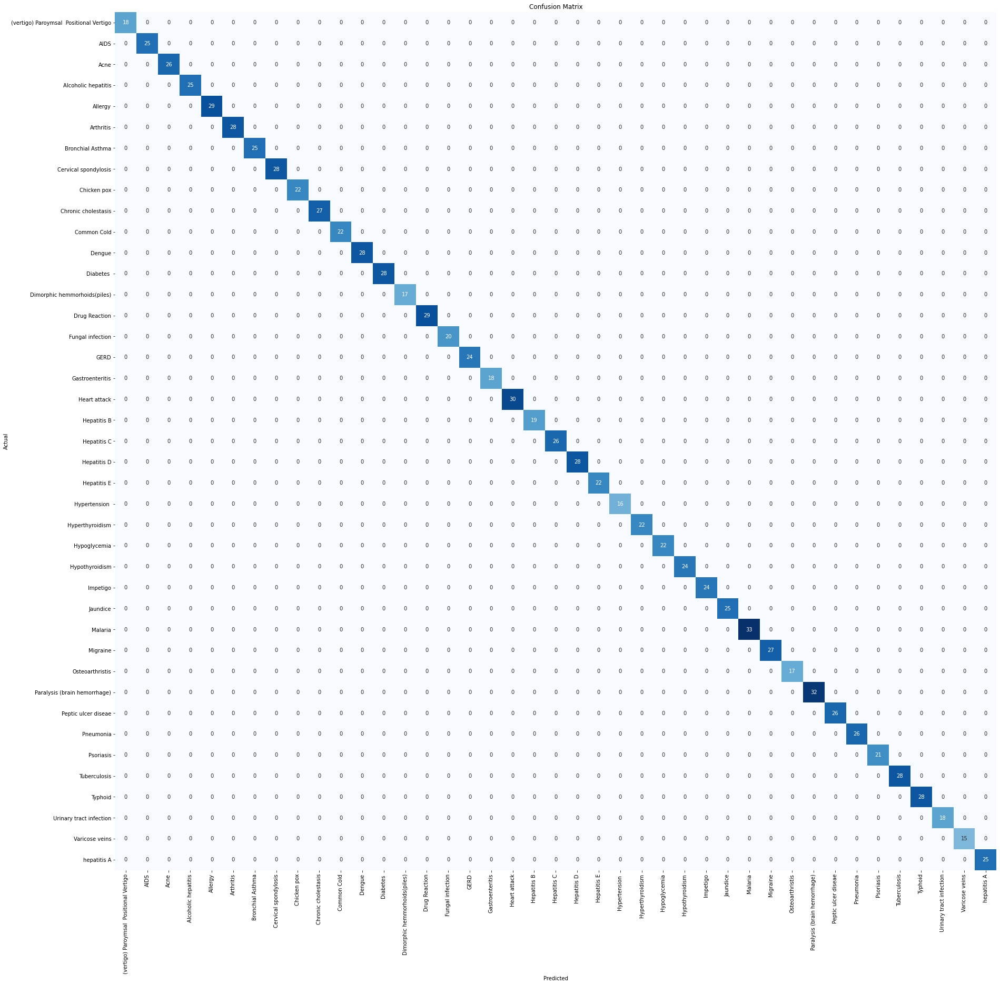

In [55]:
cm = confusion_matrix(y_test_rd, y_predict_lr)

plt.figure(figsize=(30, 30))
sns.heatmap(cm, annot=True, fmt='g', vmin=0, cmap='Blues', cbar=False)
plt.xticks(np.arange(41) + 0.5, lr.classes_, rotation=90)
plt.yticks(np.arange(41) + 0.5, lr.classes_, rotation=0)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

## Dummy Encoding

In [56]:
y_train_enc_rd = pd.get_dummies(y_train_rd)
y_test_enc_rd = pd.get_dummies(y_test_rd)

## Reduced data for Neural Network

In [57]:
import keras
from keras.layers import Dense
from keras.models import Sequential
from keras.callbacks import EarlyStopping

# Define the keras new reduced data model
nn = Sequential()
nn.add(Dense(64, activation='relu', input_shape=(x_train_rd.shape[1],)))
nn.add(Dense(32, activation='relu'))
nn.add(Dense(16, activation='relu'))
nn.add(Dense(y_train_enc_rd.shape[1], activation='softmax'))

from tensorflow.keras.optimizers import Adam  # - Works
from keras import metrics

nn.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
# Fit the keras model on the dataset
early_stopping_monitor= EarlyStopping(patience=2, monitor='val_accuracy')
history = nn.fit(x_train_rd, y_train_enc_rd, epochs=150, batch_size=10, validation_split=0.3, callbacks=[early_stopping_monitor])#,validation_data=(x_test, y_test)

_, accuracy = nn.evaluate(x_test_rd, y_test_enc_rd)  # ,verbose=0 #batch_size=1, steps=5
print('\nAccuracy: %.2f' % (accuracy * 100))

Epoch 1/150
278/278 [==============================] - 2s 3ms/step - loss: 2.4607 - accuracy: 0.4014 - val_loss: 0.6847 - val_accuracy: 0.8791
Epoch 2/150
278/278 [==============================] - 1s 3ms/step - loss: 0.1951 - accuracy: 0.9838 - val_loss: 0.0548 - val_accuracy: 0.9950
Epoch 3/150
278/278 [==============================] - 1s 3ms/step - loss: 0.0304 - accuracy: 0.9971 - val_loss: 0.0213 - val_accuracy: 0.9966
Epoch 4/150
278/278 [==============================] - 1s 2ms/step - loss: 0.0151 - accuracy: 0.9978 - val_loss: 0.0189 - val_accuracy: 0.9950
Epoch 5/150
32/32 [==============================] - 0s 2ms/step - loss: 0.0076 - accuracy: 0.9980

Accuracy: 99.80


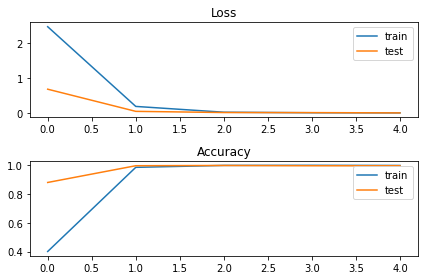

In [58]:
# plot loss during training
plt.subplot(211)
plt.title('Loss')
plt.plot(history.history['loss'], label='train')
plt.plot(history.history['val_loss'], label='test')
plt.legend()
# plot accuracy during training
plt.subplot(212)
plt.title('Accuracy')
plt.plot(history.history['accuracy'], label='train')
plt.plot(history.history['val_accuracy'], label='test')
plt.legend()
plt.tight_layout()
plt.show()

In [59]:
# Print the precision and recall, among other metrics
from sklearn.metrics import classification_report

y_predict_nn_rd = nn.predict(x_test_rd)
y_predict_nn_rd  = np.argmax(y_predict_nn_rd, axis=1)

test_labels_rd = np.argmax(np.array(y_test_enc_rd), axis=1)

print('\n\n', classification_report(test_labels_rd, y_predict_nn_rd))

print(
    '\n\n ------------------------------------------------------------------------------------------------------------------ \n\n')



               precision    recall  f1-score   support

           0       1.00      1.00      1.00        18
           1       1.00      1.00      1.00        25
           2       1.00      1.00      1.00        26
           3       1.00      1.00      1.00        25
           4       1.00      1.00      1.00        29
           5       1.00      1.00      1.00        28
           6       1.00      1.00      1.00        25
           7       1.00      1.00      1.00        28
           8       1.00      1.00      1.00        22
           9       1.00      1.00      1.00        27
          10       1.00      1.00      1.00        22
          11       1.00      1.00      1.00        28
          12       1.00      1.00      1.00        28
          13       1.00      1.00      1.00        17
          14       1.00      1.00      1.00        29
          15       0.91      1.00      0.95        20
          16       1.00      1.00      1.00        24
          17       1.00 

In [60]:
print(
    '\n\n ------------------------------------------------------------------------------------------------------------------ \n\n')

print('\n\n summarize predictions cases : \n\n')
for i in range(len(y_predict_nn_rd)):
    print(
        '\n\n ------------------------------------------------------------------------------------------------------------------ \n\n')
    
    print(x_train_rd.iloc[i],' \n\n( expected ', y_train_rd.iloc[y_predict_nn_rd[i]],')')




 ------------------------------------------------------------------------------------------------------------------ 




 summarize predictions cases : 




 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
chills                  0
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 4434, Length: 98, dtype: int64  

( expected  (vertigo) Paroymsal  Positional Vertigo )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
chills                  0
joint_pain              1
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_d

Name: 2009, Length: 98, dtype: int64  

( expected  Migraine )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
chills                  0
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 2141, Length: 98, dtype: int64  

( expected  Migraine )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 1
skin_rash               1
chills                  0
joint_pain              0
stomach_pain            1
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 2587, Length: 98, dtype: int64  

( expected  Impetigo

itching                 0
skin_rash               1
chills                  0
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            1
silver_like_dusting     1
small_dents_in_nails    1
inflammatory_nails      1
Name: 2033, Length: 98, dtype: int64  

( expected  Acne )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 1
skin_rash               1
chills                  0
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 3132, Length: 98, dtype: int64  

( expected  Acne )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 1
skin_rash               0
chills          

( expected  Allergy )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
chills                  0
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 4312, Length: 98, dtype: int64  

( expected  Arthritis )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
chills                  0
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 4381, Length: 98, dtype: int64  

( expected  Chronic cholestasis )


 -----------------------

Name: 2808, Length: 98, dtype: int64  

( expected  Allergy )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 1
skin_rash               0
chills                  0
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 4319, Length: 98, dtype: int64  

( expected  Chronic cholestasis )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
chills                  1
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 3921, Length: 98, dtype: int64  

( expected

Name: 4485, Length: 98, dtype: int64  

( expected  Gastroenteritis )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 1
skin_rash               1
chills                  0
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 4510, Length: 98, dtype: int64  

( expected  Dimorphic hemmorhoids(piles) )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
chills                  0
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 2290, Length: 98, dtype: in

Name: 620, Length: 98, dtype: int64  

( expected  Hypothyroidism )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
chills                  0
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 621, Length: 98, dtype: int64  

( expected  Gastroenteritis )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 1
skin_rash               0
chills                  0
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 4431, Length: 98, dtype: int64  

( expecte

Name: 2592, Length: 98, dtype: int64  

( expected  Chicken pox )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
chills                  1
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 1916, Length: 98, dtype: int64  

( expected  GERD )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 1
skin_rash               0
chills                  0
joint_pain              0
stomach_pain            1
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 1271, Length: 98, dtype: int64  

( expected  Malaria )

Name: 2070, Length: 98, dtype: int64  

( expected  Urinary tract infection )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
chills                  0
joint_pain              1
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 3753, Length: 98, dtype: int64  

( expected  Fungal infection )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
chills                  0
joint_pain              1
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 3832, Length: 98, dtype: int64 

( expected  Varicose veins )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
chills                  0
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 2175, Length: 98, dtype: int64  

( expected  Varicose veins )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
chills                  0
joint_pain              1
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 2272, Length: 98, dtype: int64  

( expected  Drug Reaction )


 -----------------

( expected  AIDS )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
chills                  0
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 2027, Length: 98, dtype: int64  

( expected  Allergy )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
chills                  0
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 4517, Length: 98, dtype: int64  

( expected  Arthritis )


 --------------------------------------

( expected  Hyperthyroidism )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
chills                  0
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 4666, Length: 98, dtype: int64  

( expected  Hyperthyroidism )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
chills                  0
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 4354, Length: 98, dtype: int64  

( expected  Allergy )


 ---------------------

Name: 3617, Length: 98, dtype: int64  

( expected  Allergy )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
chills                  0
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 2594, Length: 98, dtype: int64  

( expected  Diabetes  )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
chills                  1
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 3240, Length: 98, dtype: int64  

( expected  Cervical

Name: 4362, Length: 98, dtype: int64  

( expected  Gastroenteritis )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
chills                  0
joint_pain              1
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 1056, Length: 98, dtype: int64  

( expected  Arthritis )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
chills                  0
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 4418, Length: 98, dtype: int64  

( expected  

( expected  Chronic cholestasis )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
chills                  0
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 2164, Length: 98, dtype: int64  

( expected  Hypoglycemia )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
chills                  0
joint_pain              0
stomach_pain            0
                       ..
scurring                1
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 2012, Length: 98, dtype: int64  

( expected  Chronic cholestasis )


 --------

( expected  Impetigo )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
chills                  0
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 1697, Length: 98, dtype: int64  

( expected  Acne )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
chills                  0
joint_pain              1
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 2483, Length: 98, dtype: int64  

( expected  Varicose veins )


 --------------------------------

Name: 953, Length: 98, dtype: int64  

( expected  Varicose veins )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
chills                  0
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 4072, Length: 98, dtype: int64  

( expected  Diabetes  )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
chills                  0
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 2466, Length: 98, dtype: int64  

( expected  Ar



 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
chills                  0
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 389, Length: 98, dtype: int64  

( expected  Dimorphic hemmorhoids(piles) )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
chills                  0
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 2700, Length: 98, dtype: int64  

( expected  Hyperthyroidism )


 -------------------------------



 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               1
chills                  0
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 3074, Length: 98, dtype: int64  

( expected  Varicose veins )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
chills                  0
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 3456, Length: 98, dtype: int64  

( expected  Arthritis )


 --------------------------------------------------

Name: 879, Length: 98, dtype: int64  

( expected  Impetigo )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
chills                  0
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 2715, Length: 98, dtype: int64  

( expected  Tuberculosis )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
chills                  1
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 4853, Length: 98, dtype: int64  

( expected  Acne 

Name: 305, Length: 98, dtype: int64  

( expected  Chronic cholestasis )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
chills                  0
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 2473, Length: 98, dtype: int64  

( expected  Gastroenteritis )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
chills                  0
joint_pain              1
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 3016, Length: 98, dtype: int64  

( e

( expected  Chronic cholestasis )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
chills                  1
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 1240, Length: 98, dtype: int64  

( expected  Acne )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
chills                  0
joint_pain              1
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 2602, Length: 98, dtype: int64  

( expected  AIDS )


 -------------------------------

Name: 4136, Length: 98, dtype: int64  

( expected  Hyperthyroidism )


# Reduced data for OneVsRestClassifier

In [61]:
random_state = np.random.RandomState(0)
classifier = OneVsRestClassifier(svm.LinearSVC(random_state=random_state))
classifier.fit(x_train_rd, y_train_rd)
y_score = classifier.decision_function(x_test_rd)
y_score = classifier.decision_function(x_test_rd)
yhat1 = classifier.predict(x_test_rd)
print('Accuracy: %.2f' % (accuracy_score(y_test_rd, yhat1) * 100))
print('F1: %.2f' % (f1_score(y_test_rd, yhat1, average='micro') * 100))

Accuracy: 99.80
F1: 99.80


In [62]:
#Print the precision and recall, among other metrics
from sklearn.metrics import classification_report

print('\n\n', classification_report(y_test_rd, yhat1))

print(
    '\n\n ------------------------------------------------------------------------------------------------------------------ \n\n')



                                          precision    recall  f1-score   support

(vertigo) Paroymsal  Positional Vertigo       1.00      1.00      1.00        18
                                   AIDS       1.00      1.00      1.00        25
                                   Acne       1.00      1.00      1.00        26
                    Alcoholic hepatitis       1.00      1.00      1.00        25
                                Allergy       1.00      1.00      1.00        29
                              Arthritis       1.00      1.00      1.00        28
                       Bronchial Asthma       1.00      1.00      1.00        25
                   Cervical spondylosis       1.00      1.00      1.00        28
                            Chicken pox       1.00      1.00      1.00        22
                    Chronic cholestasis       1.00      1.00      1.00        27
                            Common Cold       1.00      1.00      1.00        22
                        

In [63]:
print('\n\n summarize predictions cases : \n\n')
for i in range(len(yhat1)):
    print(
        '\n\n ------------------------------------------------------------------------------------------------------------------ \n\n')
    print(x_train_rd.iloc[i], '\n\n( expected ', yhat1[i], ')')
print(
    '\n\n ------------------------------------------------------------------------------------------------------------------ \n\n')



 summarize predictions cases : 




 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
chills                  0
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 4434, Length: 98, dtype: int64 

( expected  Impetigo )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
chills                  0
joint_pain              1
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 2863, Length: 98, dtype: int64 

( expected  Malaria )


 ------------------------

Name: 4805, Length: 98, dtype: int64 

( expected  Psoriasis )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
chills                  0
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 3497, Length: 98, dtype: int64 

( expected  Malaria )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
chills                  1
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 2069, Length: 98, dtype: int64 

( expected  hepatitis A

( expected  Drug Reaction )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
chills                  0
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 2417, Length: 98, dtype: int64 

( expected  Malaria )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
chills                  1
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 4250, Length: 98, dtype: int64 

( expected  Hepatitis D )


 -----------------------------

( expected  Bronchial Asthma )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
chills                  1
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 667, Length: 98, dtype: int64 

( expected  Peptic ulcer diseae )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
chills                  0
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 4131, Length: 98, dtype: int64 

( expected  Hypothyroidism )


 ------------

( expected  Paralysis (brain hemorrhage) )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 1
skin_rash               0
chills                  0
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 982, Length: 98, dtype: int64 

( expected  Dengue )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               1
chills                  1
joint_pain              1
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 2805, Length: 98, dtype: int64 

( expected  Dimorphic hemmorhoids(piles) )




itching                 0
skin_rash               0
chills                  0
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 1928, Length: 98, dtype: int64 

( expected  (vertigo) Paroymsal  Positional Vertigo )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
chills                  1
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 2650, Length: 98, dtype: int64 

( expected  AIDS )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash

Name: 3594, Length: 98, dtype: int64 

( expected  Migraine )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
chills                  1
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 3059, Length: 98, dtype: int64 

( expected  Alcoholic hepatitis )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
chills                  1
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 1651, Length: 98, dtype: int64 

( expected  



 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
chills                  0
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 1691, Length: 98, dtype: int64 

( expected  Osteoarthristis )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 1
skin_rash               1
chills                  0
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 4485, Length: 98, dtype: int64 

( expected  Impetigo )


 ----------------------------------------------------


itching                 0
skin_rash               0
chills                  0
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 1741, Length: 98, dtype: int64 

( expected  Cervical spondylosis )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
chills                  0
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 620, Length: 98, dtype: int64 

( expected  Heart attack )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash           

( expected  Typhoid )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
chills                  0
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 4107, Length: 98, dtype: int64 

( expected  Impetigo )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
chills                  0
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 2613, Length: 98, dtype: int64 

( expected  Chicken pox )


 ----------------------------------

Name: 3753, Length: 98, dtype: int64 

( expected  Paralysis (brain hemorrhage) )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
chills                  0
joint_pain              1
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 3832, Length: 98, dtype: int64 

( expected  Impetigo )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
chills                  0
joint_pain              1
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 2270, Length: 98, dtype: int64 

( e



 ------------------------------------------------------------------------------------------------------------------ 


itching                 1
skin_rash               0
chills                  0
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 4770, Length: 98, dtype: int64 

( expected  Drug Reaction )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
chills                  0
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 3577, Length: 98, dtype: int64 

( expected  Bronchial Asthma )


 ----------------------------------------------

Name: 1437, Length: 98, dtype: int64 

( expected  Impetigo )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               1
chills                  1
joint_pain              1
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 1819, Length: 98, dtype: int64 

( expected  Paralysis (brain hemorrhage) )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 1
skin_rash               1
chills                  0
joint_pain              0
stomach_pain            1
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 1273, Length: 98, dtype: int64 

( e

( expected  Impetigo )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
chills                  0
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 1564, Length: 98, dtype: int64 

( expected  Chronic cholestasis )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
chills                  0
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 1357, Length: 98, dtype: int64 

( expected  Cervical spondylosis )


 -------------

Name: 2513, Length: 98, dtype: int64 

( expected  Hypoglycemia )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
chills                  0
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 289, Length: 98, dtype: int64 

( expected  hepatitis A )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               1
chills                  0
joint_pain              0
stomach_pain            0
                       ..
scurring                1
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 4916, Length: 98, dtype: int64 

( expected  Acne 

( expected  Impetigo )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
chills                  0
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 3984, Length: 98, dtype: int64 

( expected  Hepatitis C )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
chills                  1
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 4865, Length: 98, dtype: int64 

( expected  Alcoholic hepatitis )


 ----------------------

Name: 118, Length: 98, dtype: int64 

( expected  Hypothyroidism )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
chills                  1
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 261, Length: 98, dtype: int64 

( expected  AIDS )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
chills                  1
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 598, Length: 98, dtype: int64 

( expected  Bronchial As

Name: 4546, Length: 98, dtype: int64 

( expected  Urinary tract infection )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               1
chills                  0
joint_pain              0
stomach_pain            0
                       ..
scurring                1
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 1190, Length: 98, dtype: int64 

( expected  Psoriasis )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 1
skin_rash               0
chills                  0
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 1266, Length: 98, dtype: int64 

( expec



 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
chills                  0
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 3067, Length: 98, dtype: int64 

( expected  GERD )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
chills                  0
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 1300, Length: 98, dtype: int64 

( expected  Hepatitis C )


 ------------------------------------------------------------

Name: 3694, Length: 98, dtype: int64 

( expected  Chicken pox )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
chills                  0
joint_pain              1
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 2892, Length: 98, dtype: int64 

( expected  Psoriasis )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
chills                  0
joint_pain              1
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 3422, Length: 98, dtype: int64 

( expected  Urinary

( expected  Hepatitis D )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
chills                  0
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 436, Length: 98, dtype: int64 

( expected  Paralysis (brain hemorrhage) )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
chills                  0
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 4275, Length: 98, dtype: int64 

( expected  Paralysis (brain hemorrhage)

( expected  Common Cold )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
chills                  0
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 2591, Length: 98, dtype: int64 

( expected  Allergy )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
chills                  0
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 4519, Length: 98, dtype: int64 

( expected  Hyperthyroidism )


 ---------------------------

( expected  Hyperthyroidism )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               1
chills                  1
joint_pain              1
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 3625, Length: 98, dtype: int64 

( expected  Peptic ulcer diseae )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 1
skin_rash               1
chills                  0
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 3608, Length: 98, dtype: int64 

( expected  Typhoid )


 -------------------

Name: 4412, Length: 98, dtype: int64 

( expected  Hypertension  )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               1
chills                  0
joint_pain              0
stomach_pain            0
                       ..
scurring                1
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 1601, Length: 98, dtype: int64 

( expected  hepatitis A )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
chills                  0
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 914, Length: 98, dtype: int64 

( expected  Pept


itching                 0
skin_rash               0
chills                  0
joint_pain              0
stomach_pain            1
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 4307, Length: 98, dtype: int64 

( expected  Paralysis (brain hemorrhage) )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
chills                  0
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 879, Length: 98, dtype: int64 

( expected  Acne )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash           

Name: 2929, Length: 98, dtype: int64 

( expected  Common Cold )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 1
skin_rash               0
chills                  0
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 4565, Length: 98, dtype: int64 

( expected  hepatitis A )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
chills                  1
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 3175, Length: 98, dtype: int64 

( expected  Hypog

( expected  Urinary tract infection )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 1
skin_rash               1
chills                  0
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 2214, Length: 98, dtype: int64 

( expected  Bronchial Asthma )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               1
chills                  1
joint_pain              1
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 1812, Length: 98, dtype: int64 

( expected  Peptic ulcer diseae )


 --

( expected  (vertigo) Paroymsal  Positional Vertigo )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 1
skin_rash               0
chills                  0
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 200, Length: 98, dtype: int64 

( expected  Hepatitis C )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
chills                  0
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 3760, Length: 98, dtype: int64 

( expected  Acne )


 -------



 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               0
chills                  0
joint_pain              1
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 1574, Length: 98, dtype: int64 

( expected  Impetigo )


 ------------------------------------------------------------------------------------------------------------------ 


itching                 0
skin_rash               1
chills                  0
joint_pain              0
stomach_pain            0
                       ..
scurring                0
skin_peeling            0
silver_like_dusting     0
small_dents_in_nails    0
inflammatory_nails      0
Name: 2623, Length: 98, dtype: int64 

( expected  Dimorphic hemmorhoids(piles) )


 ---------------------------------------